In [1]:
import osmnx as ox
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.cm as cm
from matplotlib.collections import LineCollection, PatchCollection

import numpy as np
import pandas as pd
import re
import geopandas as gpd
from shapely.geometry import Point

from sys import path # Needed if running code inside examples
path.append("../..")
import larp as lp

import larp.io as lpio
import itertools
from os.path import isfile

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

## Parameters

In [2]:
places = {
    "Marina Bay": {
        "location": (1.29332,103.86500),
        "altitude": 70, # [m]
        "dist": 2000, # [m]
        "start": (780, 800), # ([m], [m])
        "end": (-800, -800), # ([m], [m])
        "locations": [(-199, -1343), (1061, 330), (206, 541), (1838, 1570), (-877, 36), (-1554, 216), (-588, 880), (142, 1851), (-789, 1480), (-1778, 960), (1445, 1794), (701, 1295), (-91, -115), (-877, -1508), (-1541, -571), (1609, 1086), (-1070, 342), (-1113, 242), (358, -1348), (1815, -632)]
    },
    "Lucky Plaza": {
        "location": (1.305602, 103.836688),
        "altitude": 50, # [m]
        "dist": 1000, # [m]
        "start": (780, 800), # ([m], [m])
        "end": (-800, -800), # ([m], [m])
        "locations": [(-159, -902), (-957, -430), (202, -920), (412, -799), (8, -589), (-832, -904), (-187, 7), (420, 681), (696, 155), (819, -869), (450, -415), (324, -219), (203, 179), (765, 529), (-443, 524), (-577, 690), (-470, -165), (-831, 488), (-266, 340)]
    },
    "UT Austin": {
        "location": (30.27248,-97.73976),
        "altitude": 50, # [m]
        "dist": 1600, # [m]    #600
        "start": (780, 1500), # ([m], [m]) #(-430, -530)
        "end": (-1100, -1400), # ([m], [m])
        "locations": [(-1461, -145), (-1371, 307), (-831, -425), (-422, -104), (-1388, 814), (1160, 1545), (1397, 427), (1040, -161), (1357, -701), (1036, -1403), (544, -1478), (-514, -1516), (-1384, -1482), (487, -1014), (-61, -1159), (133, -466), (-134, -508), (261, 1061), (-658, 1061), (-114, 665)]
    },
    "Hong Kong": {
        "location": (22.28827,114.16399),
        "altitude": 150, # [m]
        "dist": 2500, # [m]
        "start": (1050, 1000), # ([m], [m])
        "end": (-1000, -1000), # ([m], [m])
        "locations": [(1043, 900), (450, 750), (-690 , 1650), (1600, 1200), (1397, 1640), (788, 1234), (1292, 2044), (970, 2061), (1680, 1350), (38, 1468), (-1245, -2492), (-1652, -1705), (-686, -1922), (554, -1300), (140, -840), (2123, -2456), (-1878, -1979), (668, -1330), (1992, -1100), (-841, -1882)]
    },
    "Boston": {
        "location": (42.35884,-71.05692),
        "altitude": 50, # [m]
        "dist": 1600, # [m]
        "start": (780, 800), # ([m], [m])
        "end": (-800, -800), # ([m], [m])
        "locations": [(-6.3, 627.0), (357.4, -124.9), (-59.2, -830.0), (1371.5, -771.1), (1410.1, 679.9), (1377.6, 1401.3), (79.0, 1059.9), (-1542.7, 919.7), (-963.5, 212.5), (-646.5, -2.9), (-1231.7, -265.1), (-1390.2, -470.3), (-1059.0, -1199.9), (452.9, -1411.2), (473.3, -1114.5), (-664.8, -1474.2), (-313.2, -580.1), (164.4, 147.5), (270.0, 440.1)]
    }
}

name = "Boston"
place = places[name]
edges = [0.2, 0.4, 0.6, 0.8]

start = place["start"]
end = place["end"]
locations = np.array(place["locations"])

## Build map

Note build map may be slow the first time as OSM map needs to be downloaded and cached

In [3]:
# ==========================================
# Helper Functions
# ==========================================

def hex_to_rgb(hex_color):
    hex_color = hex_color.lstrip("#")
    return np.array([int(hex_color[i:i + 2], 16) for i in (0, 2, 4)]) / 255.0

def interpolate_colors(c1, c2, t):
    return (1.0 - t) * c1 + t * c2

# ==========================================
# Core Class
# ==========================================

class UrbanMapVisualizer:

    RESTRICTED_WATER_ZONES  = [
            (22.3193, 114.1694, 50.0),  # Hong Kong Region (50km radius)
            # Add others here if needed, e.g., (1.3521, 103.8198, 20.0) for Singapore if needed
        ]

    def __init__(self, location, dist=500, altitude=50, **kwargs):
        self.location_query = location
        self.dist = dist
        self.altitude = altitude
        
        # Data Layers
        self.buildings = None
        self.water = None
        self.parks = None
        self.streets = None
        self.beaches = None
        
        self.center_point = None
        self.map_center_x = 0
        self.map_center_y = 0

        # Config settings
        ox.settings.use_cache = True
        ox.settings.log_console = False

        self._load_data()
        
        # Pre-calculate view radius for depth fade
        self.view_radius = dist * 0.6 
        
        # Initialize styles
        self.update_altitude(altitude)

    def _haversine_distance(self, lat1, lon1, lat2, lon2):
        """Calculates distance in km using NumPy (vectorized)."""
        R = 6371  # Earth radius in km
        
        # Convert to radians (handles both scalars and arrays)
        lat1, lon1 = np.radians(lat1), np.radians(lon1)
        lat2, lon2 = np.radians(lat2), np.radians(lon2)
        
        dlat = lat2 - lat1
        dlon = lon2 - lon1
        
        a = np.sin(dlat / 2.0)**2 + \
            np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2
            
        c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
        return R * c

    def _is_restricted_zone(self):
        """Checks if the current center point is within any restricted water zone."""
        if self.center_point is None or not self.RESTRICTED_WATER_ZONES: 
            return False
        
        curr_lat, curr_lon = self.center_point
        
        # Convert zones list to numpy array: shape (N, 3) -> [[lat, lon, radius], ...]
        zones = np.array(self.RESTRICTED_WATER_ZONES)
        z_lats = zones[:, 0]
        z_lons = zones[:, 1]
        z_radii = zones[:, 2]
        
        # Vectorized distance check (1 point vs N zones)
        dists = self._haversine_distance(curr_lat, curr_lon, z_lats, z_lons)
        
        # Return True if ANY zone is within range
        return np.any(dists <= z_radii)

    def _load_data(self):
        """Downloads and prepares geometric data (Buildings + Water + Streets)."""
        # 1. Geocode
        if isinstance(self.location_query, str):
            self.center_point = ox.geocode(self.location_query)
        else:
            self.center_point = self.location_query

        # ---------------------------
        # A. Fetch Buildings
        # ---------------------------
        tags_b = {
            "building": True,
            "building:levels": True,
            "building:part": True, 
            "structure": True
        }
        # Note: If this fails in some versions, ensure shapely is updated or handle empty returns
        gdf = ox.features_from_point(self.center_point, tags=tags_b, dist=self.dist*1.4)

        # Filter & Project Buildings
        gdf = gdf[gdf.geometry.type.isin(["Polygon", "MultiPolygon"])].copy()
        if "location" in gdf.columns:
            gdf = gdf[gdf["location"] != "underground"]
        
        # Establish CRS based on buildings (Universal Transverse Mercator)
        utm_crs = gdf.estimate_utm_crs()
        gdf = gdf.to_crs(utm_crs)

        # Calculate Height & Center
        gdf["calc_height"] = gdf.apply(self._extract_height, axis=1)
        
        center_geom = Point(self.center_point[1], self.center_point[0])
        
        # Create a GeoSeries with the point and project it to the same CRS as the buildings
        center_gs = gpd.GeoSeries([center_geom], crs="EPSG:4326").to_crs(utm_crs)
        
        self.map_center_x = center_gs[0].x
        self.map_center_y = center_gs[0].y
        
        # Recalculate distance from this fixed center
        gdf["center_dist"] = np.sqrt(
            (gdf.geometry.centroid.x - self.map_center_x)**2 + 
            (gdf.geometry.centroid.y - self.map_center_y)**2
        )
        self.buildings = gdf

        # ---------------------------
        # B. Fetch Water
        # ---------------------------
        natural_tags = ["water", "bay", "wetland", "coastline", "strait", "sea"]

        if self._is_restricted_zone():
            print(f"Location {self.center_point} detected in Restricted Water Zone. Removing 'bay'/'coastline' tags.")
            natural_tags = [t for t in natural_tags if t not in ["bay"]]

        tags_w = {
            "natural": natural_tags,
            "place": ["sea", "ocean"],
            "waterway": ["riverbank", "dock", "canal", "river", "stream", "drain"],
            "landuse": ["reservoir", "basin", "salt_pond"],
            "leisure": ["marina", "swimming_pool"]
        }

        try:
            water_gdf = ox.features_from_point(self.center_point, tags=tags_w, dist=self.dist*1.4)
            if not water_gdf.empty:
                if "tunnel" in water_gdf.columns:
                    water_gdf = water_gdf[~water_gdf["tunnel"].isin(["yes", "culvert"])]
                if "location" in water_gdf.columns:
                    water_gdf = water_gdf[water_gdf["location"] != "underground"]
                if "covered" in water_gdf.columns:
                    water_gdf = water_gdf[water_gdf["covered"] != "yes"]

                self.water = water_gdf.to_crs(utm_crs)
        except Exception as e:
            print(f"No water found or error fetching water: {e}")
            self.water = None

        # ---------------------------
        # C. Fetch Nature (Parks & Beaches)
        # ---------------------------
        tags_nature = {
            "natural": ["beach", "sand", "dune", "wood", "scrub", "heath"],
            "leisure": ["park", "garden", "nature_reserve", "golf_course", "beach_resort"],
            "landuse": ["grass", "forest", "meadow", "recreation_ground", "village_green"]
        }
        
        try:
            nature_gdf = ox.features_from_point(self.center_point, tags=tags_nature, dist=self.dist)
            if not nature_gdf.empty:
                nature_gdf = nature_gdf.to_crs(utm_crs)
                
                # Split into Sand vs Greenery
                # 1. Identify Sand/Beach
                is_sand = (nature_gdf["natural"].isin(["beach", "sand", "dune"])) | \
                          (nature_gdf["leisure"] == "beach_resort")
                
                self.beaches = nature_gdf[is_sand].copy()
                self.parks = nature_gdf[~is_sand].copy() # Everything else is Greenery
        except Exception:
            self.beaches = None
            self.parks = None

        # ---------------------------
        # D. Fetch Streets
        # ---------------------------
        try:
            # 1. Fetch Graph
            G = ox.graph_from_point(self.center_point, dist=self.dist, network_type='all')
            self._impute_street_widths(G)
            _, edges = ox.graph_to_gdfs(G)
            
            if not edges.empty:
                self.streets = edges.to_crs(utm_crs)
        except Exception as e:
            print(f"No streets found or error fetching streets: {e}")
            self.streets = None

    def _extract_height(self, row):
        """Robust height extraction helper."""
        val = row.get("height")
        if pd.notna(val):
            m = re.findall(r"[-+]?\d*\.\d+|\d+", str(val))
            if m: return float(m[0])
            
        levels = row.get("building:levels") or row.get("levels")
        if pd.notna(levels):
            m = re.findall(r"[-+]?\d*\.\d+|\d+", str(levels))
            if m: return float(m[0]) * 3.5
            
        return 12.0
    
    def _impute_street_widths(self, G):
        """
        Manually adds a 'width' attribute to edges if missing, 
        based on the 'highway' type.
        """
        # Comprehensive defaults (in meters)
        defaults = {
            # --- Major Roads ---
            "motorway": 18.0, 
            "trunk": 16.0, 
            "primary": 14.0, 
            "secondary": 12.0, 
            "tertiary": 10.0,
            
            # --- Link Roads (Ramps/Connectors) ---
            "motorway_link": 10.0,
            "trunk_link": 9.0,
            "primary_link": 8.0,
            "secondary_link": 7.0,
            "tertiary_link": 7.0,
            
            # --- Local/Urban Roads ---
            "residential": 7.0, 
            "unclassified": 6.0, 
            "living_street": 6.0,  # Shared space
            "service": 4.5,        # Alleys, driveways
            "road": 6.0,           # Fallback for undefined
            
            # --- Special Types ---
            "track": 3.0,          # Forestry/Agricultural
            "bus_guideway": 6.0,
            "escape": 5.0,
            "raceway": 10.0,
            "pedestrian": 6.0,     # Wide pedestrian zones
            "path": 2.0,
            "footway": 2.0,
            "cycleway": 2.5,
            "bridleway": 2.5,
            "steps": 1.5,
            "corridor": 2.0
        }
        
        # Iterate over all edges (u, v, key, data)
        for u, v, k, data in G.edges(data=True, keys=True):
            if "width" not in data:
                highway = data.get("highway")
                
                if isinstance(highway, list):
                    highway = highway[0]
                
                # Assign default or fallback to 4.0m
                data["width"] = defaults.get(highway, 4.0)
                
        return G

    def update_altitude(self, new_altitude):
        self.altitude = new_altitude
        if self.buildings is None or self.buildings.empty:
            return

        df = self.buildings
        df["delta_h"] = df["calc_height"] - self.altitude
        df["is_obstacle"] = df["delta_h"] >= 0

        # Colors
        c_below_near = hex_to_rgb("#616161") 
        c_below_far = hex_to_rgb("#f2f2f2")
        c_above_dark = hex_to_rgb("#50473A") 
        c_above_obs = hex_to_rgb("#575757")

        colors = np.zeros((len(df), 3))
        mask_obs = df["is_obstacle"].values
        mask_bg = ~mask_obs

        # A. Obstacles
        t_obs = np.clip(df.loc[mask_obs, "delta_h"] / 50.0, 0.0, 1.0).values[:, None]
        colors[mask_obs] = interpolate_colors(c_above_obs, c_above_dark, t_obs)
        
        # B. Background
        t_bg = np.clip(-df.loc[mask_bg, "delta_h"] / 100.0, 0.0, 1.0).values[:, None]
        colors[mask_bg] = interpolate_colors(c_below_near, c_below_far, t_bg)

        df["face_rgb"] = list(colors)
        df["hatch"] = np.where(mask_obs, "///", None)
        df["edge_color"] = np.where(mask_obs, "#ff4400", "#d0d0d0")
        df["edge_width"] = np.where(mask_obs, 2.0, 0.5)
        
        alpha_obs = 0.4 + (0.5 * t_obs.flatten())
        df.loc[mask_obs, "base_alpha"] = alpha_obs
        df.loc[mask_bg, "base_alpha"] = 0.35
        df["zorder"] = (df["calc_height"] / 1000.0) + np.where(mask_obs, 10, 1)

    def get_obstacles(self):
        if self.buildings is None: return []
        return self.buildings[self.buildings["is_obstacle"]].geometry.tolist()
    
    def get_obstacle_rgjs(self):
        """Exports obstacles in RGJ format (List of Dicts) with normalized coordinates."""
        if self.buildings is None: return []
        
        obstacles = self.buildings[self.buildings["is_obstacle"]].geometry
        rgjs = []
        
        for geom in obstacles:
            if geom.geom_type == 'Polygon': polys = [geom]
            elif geom.geom_type == 'MultiPolygon': polys = geom.geoms
            else: continue
            
            for poly in polys:
                x, y = poly.convex_hull.exterior.xy
                
                # Normalize to center (0,0)
                pts = np.column_stack((
                    np.array(x) - self.map_center_x, 
                    np.array(y) - self.map_center_y
                ))
                
                if not np.allclose(pts[0], pts[-1]):
                    pts = np.vstack([pts, pts[0]])
                    
                rgjs.append({
                    "type": "Polygon",
                    "coordinates": pts.tolist(),
                    "repulsion": [[20.0, 0], [0, 20.0]]
                })
        return rgjs

    def plot_environment(self, ax):
        # 1. Plot Water (Base Layer)
        if self.water is not None:
            for geom in self.water.geometry:
                if geom.is_empty: continue
                
                # Normalize geometry to list of polygons/lines
                geoms_to_plot = []
                if geom.geom_type in ['Polygon', 'LineString']:
                    geoms_to_plot = [geom]
                elif geom.geom_type in ['MultiPolygon', 'MultiLineString']:
                    geoms_to_plot = geom.geoms

                for g in geoms_to_plot:
                    # LineString handling for rivers represented as lines
                    if g.geom_type == 'LineString':
                        x, y = g.xy
                        ax.plot(
                            np.array(x) - self.map_center_x, 
                            np.array(y) - self.map_center_y, 
                            color="#aed6f1", linewidth=4, alpha=0.6, zorder=0
                        )
                    # Polygon handling for lakes/wide rivers
                    elif g.geom_type == 'Polygon':
                        x, y = g.exterior.xy
                        pts = np.column_stack((
                            np.array(x) - self.map_center_x, 
                            np.array(y) - self.map_center_y
                        ))
                        ax.add_patch(patches.Polygon(
                            pts, closed=True,
                            facecolor="#aed6f1", 
                            edgecolor=None, linewidth=0, alpha=0.6, zorder=0.2
                        ))

        # 2. Plot Nature (Z=0.1)
        # --- A. Beaches (Sand) ---
        if self.beaches is not None:
            for geom in self.beaches.geometry:
                if geom.is_empty: continue
                geoms = [geom] if geom.geom_type == 'Polygon' else getattr(geom, 'geoms', [])
                for poly in geoms:
                    if poly.geom_type != 'Polygon': continue
                    x, y = poly.exterior.xy
                    pts = np.column_stack((np.array(x) - self.map_center_x, np.array(y) - self.map_center_y))
                    
                    # Draw Sand (#F3E2C8)
                    ax.add_patch(patches.Polygon(pts, closed=True, facecolor="#F3E2C8", lw=0, alpha=0.7, zorder=0.1))

        # --- B. Parks (Greenery) ---
        if self.parks is not None:
            for geom in self.parks.geometry:
                if geom.is_empty: continue
                geoms = [geom] if geom.geom_type == 'Polygon' else getattr(geom, 'geoms', [])
                for poly in geoms:
                    if poly.geom_type != 'Polygon': continue
                    x, y = poly.exterior.xy
                    pts = np.column_stack((np.array(x) - self.map_center_x, np.array(y) - self.map_center_y))
                    
                    # Draw Greenery (#c8e6c9 is a soft green)
                    ax.add_patch(patches.Polygon(pts, closed=True, facecolor="#c8e6c9", lw=0, alpha=0.6, zorder=0.1))

        # 3. Plot Streets
        if self.streets is not None:
            street_patches = []
            
            # Iterate over edges to buffer them individually
            for _, row in self.streets.iterrows():
                geom = row.geometry
                
                # Extract width (OSM data can be messy: string, list, or float)
                w_val = row.get("width", 4.0)
                try:
                    if isinstance(w_val, list):
                        # If multiple widths exist, take the first one or average
                        w = float(w_val[0])
                    elif isinstance(w_val, str):
                        # Extract number from string like "10.5 m"
                        w = float(re.findall(r"[-+]?\d*\.\d+|\d+", w_val)[0])
                    else:
                        w = float(w_val)
                except:
                    w = 4.0 # Safe fallback

                # Create a polygon for physical road surface
                # Buffer radius = width / 2
                poly_geom = geom.buffer(w / 2)

                # Normalize Coordinates to Map Center
                if poly_geom.geom_type == 'Polygon':
                    polys = [poly_geom]
                elif poly_geom.geom_type == 'MultiPolygon':
                    polys = poly_geom.geoms
                else:
                    continue

                for p in polys:
                    x, y = p.exterior.xy
                    pts = np.column_stack((
                        np.array(x) - self.map_center_x, 
                        np.array(y) - self.map_center_y
                    ))
                    
                    street_patches.append(patches.Polygon(pts, closed=True))

            # Use PatchCollection for high performance rendering of many polygons
            if street_patches:
                pc = PatchCollection(
                    street_patches, 
                    facecolor='#d9d9d9', # Standard asphalt grey
                    edgecolor='none', 
                    alpha=0.9, 
                    zorder=0.5, # Above water, below buildings
                    antialiased=True
                )
                ax.add_collection(pc)

        # 4. Plot Buildings (Top Layer)
        if self.buildings is None: return

        df_sorted = self.buildings.sort_values("calc_height")
        dists = df_sorted["center_dist"].values
        dist_fades = np.clip(1.0 - (dists / self.view_radius), 0.5, 1.0)

        iterator = zip(
            df_sorted.geometry, 
            df_sorted["is_obstacle"],
            df_sorted["face_rgb"],
            df_sorted["hatch"],
            df_sorted["edge_color"],
            df_sorted["edge_width"],
            df_sorted["base_alpha"],
            df_sorted["zorder"],
            dist_fades
        )

        for geom, is_obs, rgb, hatch, ec, lw, base_alpha, z, d_fade in iterator:
            
            final_fade = (0.2 + 0.8 * d_fade) if is_obs else d_fade
            final_alpha = base_alpha * final_fade
            
            if geom.geom_type == 'Polygon':
                polys = [geom]
            elif geom.geom_type == 'MultiPolygon':
                polys = geom.geoms
            else:
                continue

            for poly in polys:
                x, y = poly.exterior.xy
                pts = np.column_stack((
                    np.array(x) - self.map_center_x, 
                    np.array(y) - self.map_center_y
                ))

                # Fill
                ax.add_patch(patches.Polygon(
                    pts, closed=True,
                    facecolor=rgb,
                    edgecolor="#2b2b2b" if is_obs else None,
                    linewidth=0,
                    hatch=hatch,
                    alpha=final_alpha,
                    zorder=z,
                    antialiased=True
                ))

                # Border
                if is_obs:
                    border_lw = lw * min(final_fade, 0.5)
                    border_alpha = 1.0
                else:
                    border_lw = lw * final_fade
                    border_alpha = final_alpha
                
                ax.add_patch(patches.Polygon(
                    pts, closed=True,
                    facecolor="none",
                    edgecolor=ec,
                    linewidth=border_lw,
                    alpha=border_alpha,
                    zorder=z + 0.1,
                    antialiased=True
                ))

def draw_quadtree_boundaries(ax, quadtree, margin=0.5, linewidth=1.5, alpha=0.5, zorder=25):
    """
    Draws the QuadTree boundaries onto the provided axes using a LineCollection.
    """
    boundaries_lines = quadtree.to_boundary_lines_collection(margin=margin)
    boundaries_ranges = quadtree.get_quad_maximum_range()

    segments = []
    colors = []

    for i in range(0, len(boundaries_lines), 2):
        xs, ys = boundaries_lines[i], boundaries_lines[i+1]
        segments.append(list(zip(xs, ys)))

        risk = boundaries_ranges[i//2]

        c = "#e4ebff" if np.isinf(risk) else cm.jet(risk)

        colors.append(c)

    if segments:
        lc = LineCollection(
            segments, 
            colors=colors, 
            linewidths=linewidth, 
            alpha=alpha, 
            zorder=zorder
        )
        ax.add_collection(lc)

viz = UrbanMapVisualizer(**place)

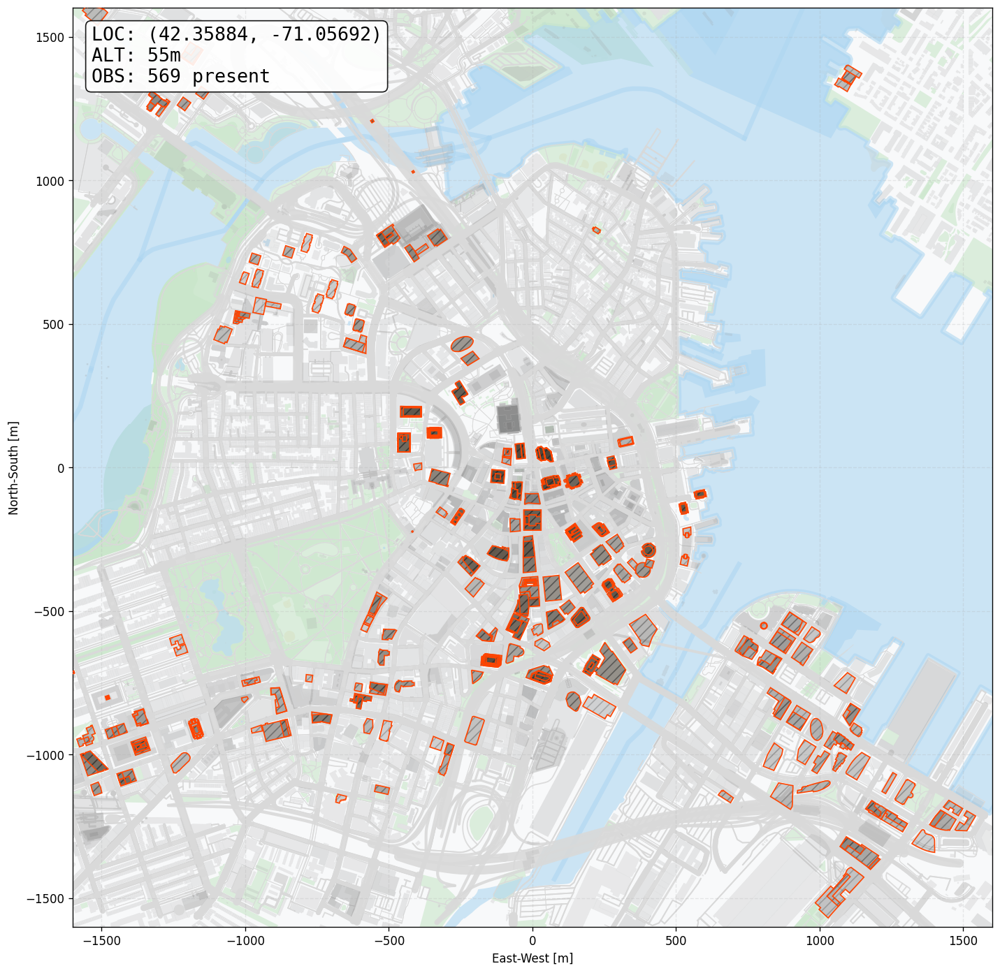

In [4]:
fig, ax = plt.subplots(figsize=(12, 12), dpi=120)

ax.set_facecolor("#f8f9fa")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.25)

ax.set_xlim(-place["dist"], place["dist"])
ax.set_ylim(-place["dist"], place["dist"])
ax.set_xlabel("East-West [m]")
ax.set_ylabel("North-South [m]")

viz.plot_environment(ax)

obs_count = len(viz.get_obstacle_rgjs())
loc, alt = place["location"], place["altitude"]+5
info_str = (f"LOC: {loc}\n"
            f"ALT: {alt}m\n"
            f"OBS: {obs_count} present")

ax.text(0.02, 0.98, info_str, transform=ax.transAxes,
        va="top", fontsize=16, family="monospace",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.9), zorder=1000)

plt.tight_layout()
plt.show()

## Load potential field

In [9]:
field = lp.RiskField(rgjs=viz.get_obstacle_rgjs(), center_point=(0, 0), size=place['dist']*2, minimum_cell_size=10.0)
field.set_all_repulsion([[2000.0, 0.0], [0.0, 2000.0]])

quadtree = lp.quad.QuadTree(field, minimum_length_limit=place['dist']/120, build_tree=True)
planner = lp.pp.QuadPlanner(quadtree)
planner.select_alg('a*')
qfield = field

For extreme high resolution maps, it may be worth saving and loading it in the next run, instead of recreating it on each run. You can do so by umcommenting the code below and commenting the code above.

In [ ]:
""" if isfile('map.qlp'):
    quadtree, field = lpio.loadQuadTreeFile('map.qlp', return_field=True)
else:
    field = lp.RiskField(rgjs=viz.get_obstacle_rgjs(), center_point=(0, 0), size=place['dist']*2, minimum_cell_size=20.0)
    field.set_all_repulsion([[2000.0, 0.0], [0.0, 2000.0]])

    quadtree = lp.quad.QuadTree(field, minimum_length_limit=20.0, build_tree=True)
    lpio.saveQuadTree(quadtree, file='map.qlp')

planner = lp.pp.QuadPlanner(quadtree)
planner.select_alg('a*')

qfield = field """


In [10]:
margin = 20.0
display, extent = qfield.to_image(resolution=900, margin=margin, max_depth=5)

## Display field

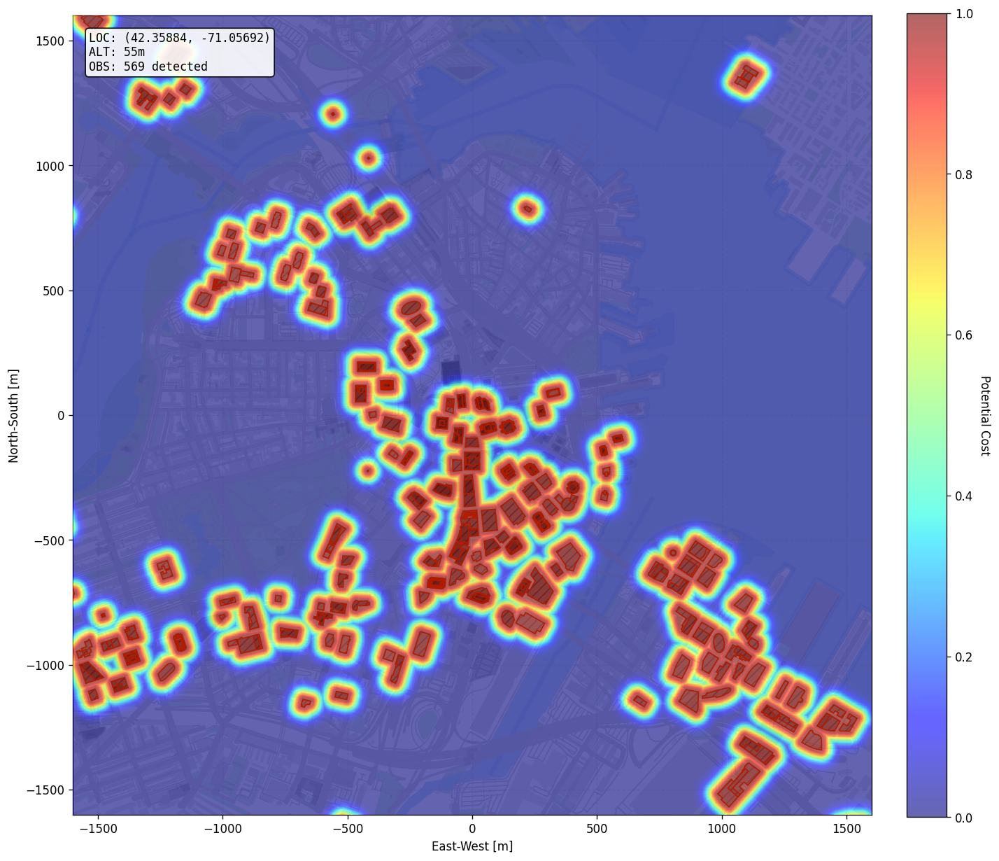

In [11]:
fig, ax = plt.subplots(figsize=(12, 12), dpi=120)

ax.set_facecolor("#f8f9fa")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.25)

ax.set_xlim(-place["dist"], place["dist"])
ax.set_ylim(-place["dist"], place["dist"])
ax.set_xlabel("East-West [m]")
ax.set_ylabel("North-South [m]")


img = ax.imshow(display, cmap='jet', extent=extent, alpha=0.6, zorder=20)

# Draw environment (streets/buildings) underneath
viz.plot_environment(ax)

# Add Colorbar (Optional, matches the purple theme)
cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Potential Cost', rotation=270, labelpad=15)

obs_count = len(viz.get_obstacle_rgjs())
loc, alt = place["location"], place["altitude"]+5
info_str = (f"LOC: {loc}\n"
            f"ALT: {alt}m\n"
            f"OBS: {obs_count} detected")

ax.text(0.02, 0.98, info_str, transform=ax.transAxes,
        va="top", fontsize=10, family="monospace",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.9), zorder=1000)

plt.tight_layout()
plt.show()

## Cell decomposition and routing network

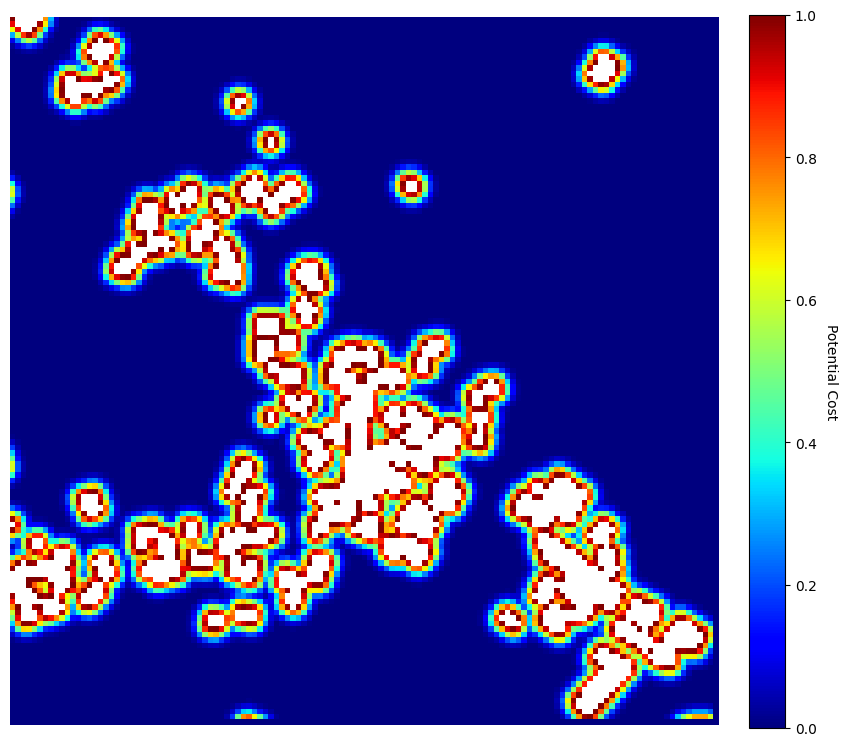

In [12]:
%matplotlib inline
display_q, extent_q = quadtree.to_image(return_extent=True, max_depth=10)

# Plot the quad sectors image
fig, ax = plt.subplots(figsize=(10, 10))
img = plt.imshow(display_q, cmap='jet', extent=extent_q, interpolation='nearest')
ax.axis(False)
img.set_clim(0.0, 1.0)
cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Potential Cost', rotation=270, labelpad=15)

plt.show()

AttributeError: 'larp.field_cy.quadtree.QuadTree' object has no attribute 'ZONEToMaxRANGE'

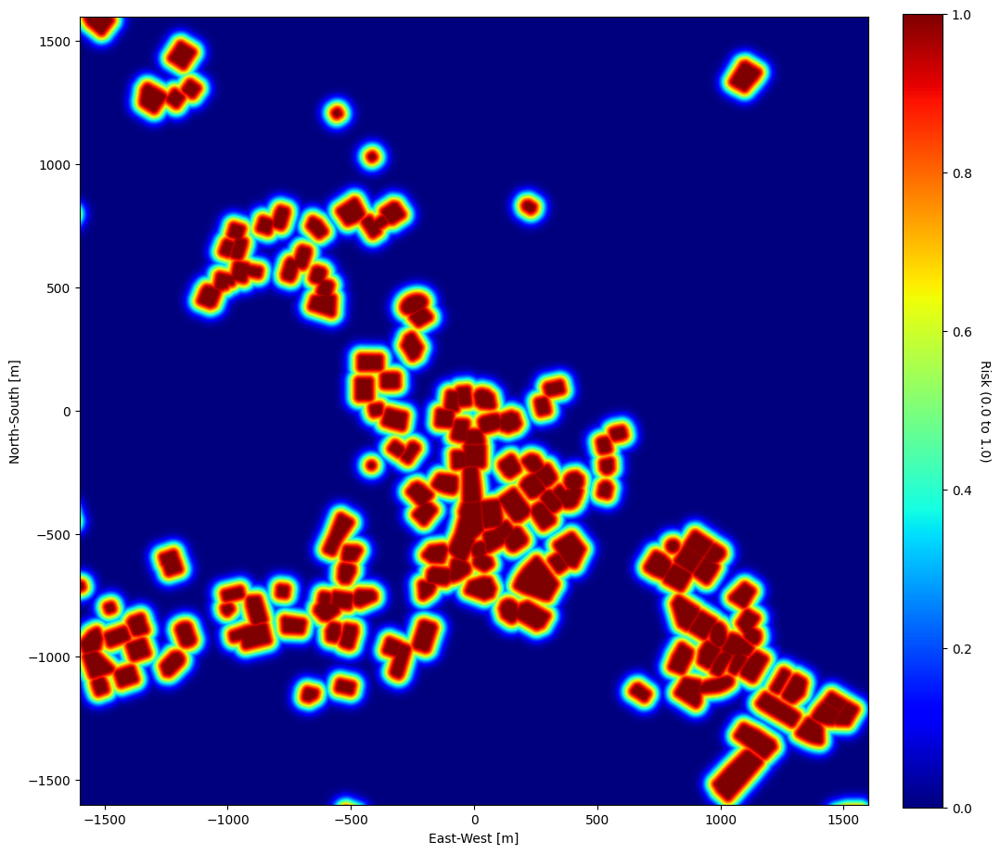

In [13]:
fig, ax = plt.subplots(figsize=(12, 12))

ax.set_aspect("equal")

ax.set_xlim(-place["dist"], place["dist"])
ax.set_ylim(-place["dist"], place["dist"])
ax.set_xlabel("East-West [m]")
ax.set_ylabel("North-South [m]")

img = ax.imshow(display, cmap='jet', extent=extent)
ax.axis(True)
img.set_clim(0.0, 1.0)
cbar = fig.colorbar(img, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Risk (0.0 to 1.0)', rotation=270, labelpad=15)

draw_quadtree_boundaries(ax, quadtree, margin=5, alpha=1.0, linewidth=2.2)
plt.show()

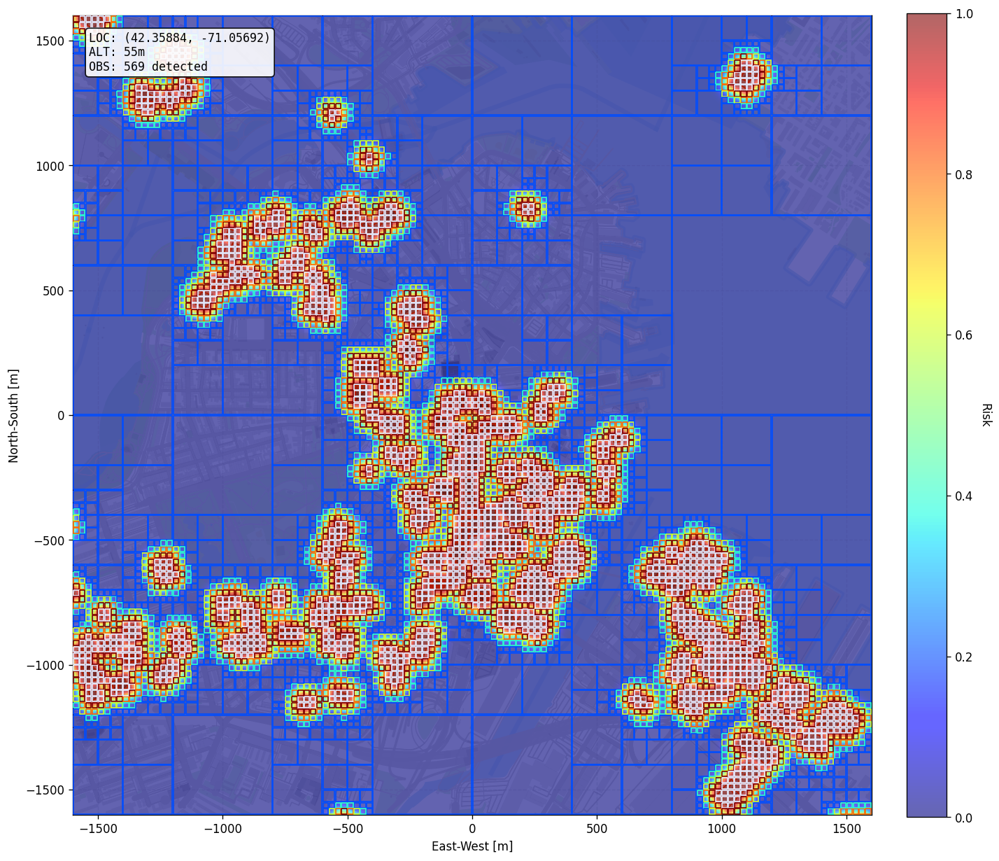

In [11]:
fig, ax = plt.subplots(figsize=(12, 12), dpi=120)

ax.set_facecolor("#f8f9fa")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.25)
ax.set_xlim(-place["dist"], place["dist"])
ax.set_ylim(-place["dist"], place["dist"])
ax.set_xlabel("East-West [m]")
ax.set_ylabel("North-South [m]")

viz.plot_environment(ax)
img = ax.imshow(display, cmap='jet', extent=extent, alpha=0.6, zorder=20)

# Add Colorbar
cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Risk', rotation=270, labelpad=15)

draw_quadtree_boundaries(ax, quadtree, linewidth=1.0, alpha=1, margin=2)

# Text Info
obs_count = len(field)
loc = place.get("location", "Unknown")
alt = place.get("altitude", 0) + 5
info_str = (f"LOC: {loc}\n"
            f"ALT: {alt}m\n"
            f"OBS: {obs_count} detected")

ax.text(0.02, 0.98, info_str, transform=ax.transAxes,
        va="top", fontsize=10, family="monospace",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.9), zorder=1000)

plt.tight_layout()
plt.show()

## Search route

In [12]:
sub_path = []
path = planner.find_path(start_point=start, end_point=end)

if path is None:
    print("Path not found")

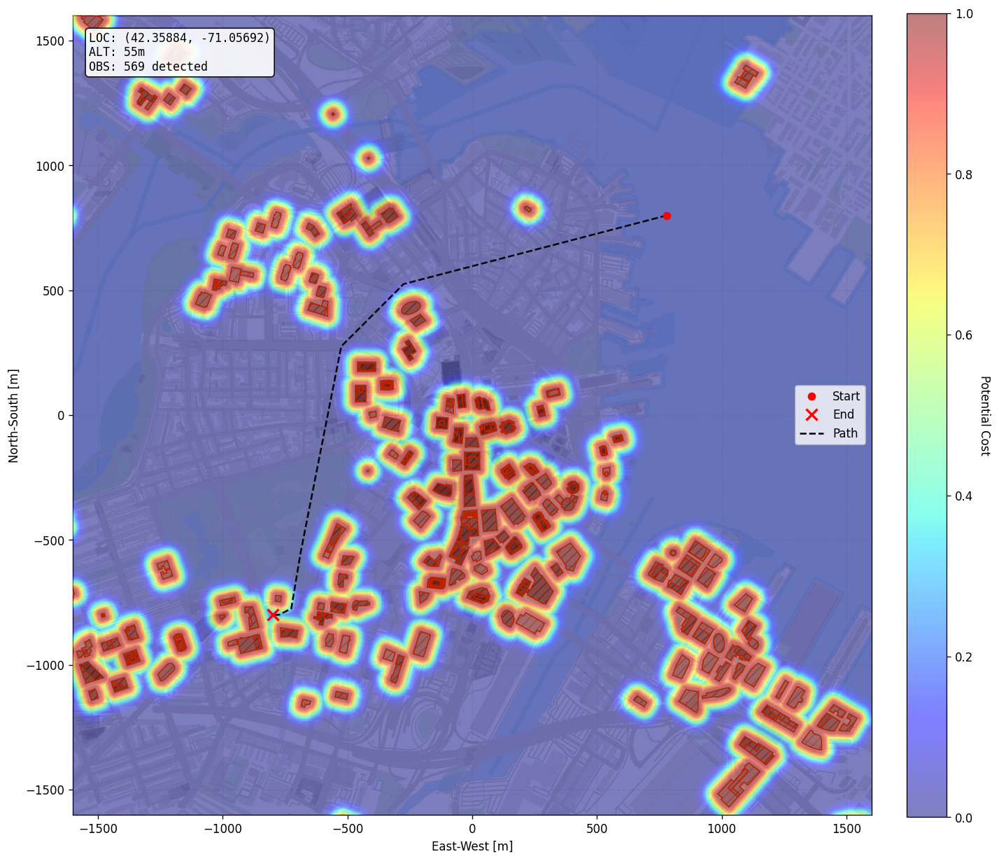

In [13]:
fig, ax = plt.subplots(figsize=(12, 12), dpi=120)

ax.set_facecolor("#f8f9fa")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.25)

ax.set_xlim(-place["dist"], place["dist"])
ax.set_ylim(-place["dist"], place["dist"])
ax.set_xlabel("East-West [m]")
ax.set_ylabel("North-South [m]")


img = ax.imshow(display, cmap='jet', extent=extent, alpha=0.5, zorder=20)

# Draw environment (streets/buildings) underneath
viz.plot_environment(ax)

ax.plot(path[0, 0], path[0, 1], 'r.', markersize=10.0, markeredgewidth=2, zorder=999, label="Start")
ax.plot(path[-1, 0], path[-1, 1], 'rx', markersize=10.0, markeredgewidth=2, zorder=999, label="End")
ax.plot(path[:, 0], path[:, 1], 'k--', alpha=1.0, zorder=998, label="Path")

# Add Colorbar (Optional, matches the purple theme)
cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Potential Cost', rotation=270, labelpad=15)

obs_count = len(viz.get_obstacle_rgjs())
loc, alt = place["location"], place["altitude"]+5
info_str = (f"LOC: {loc}\n"
            f"ALT: {alt}m\n"
            f"OBS: {obs_count} detected")

ax.text(0.02, 0.98, info_str, transform=ax.transAxes,
        va="top", fontsize=10, family="monospace",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.9), zorder=1000)

ax.legend(loc='right').set_zorder(1000)

plt.tight_layout()
plt.show()

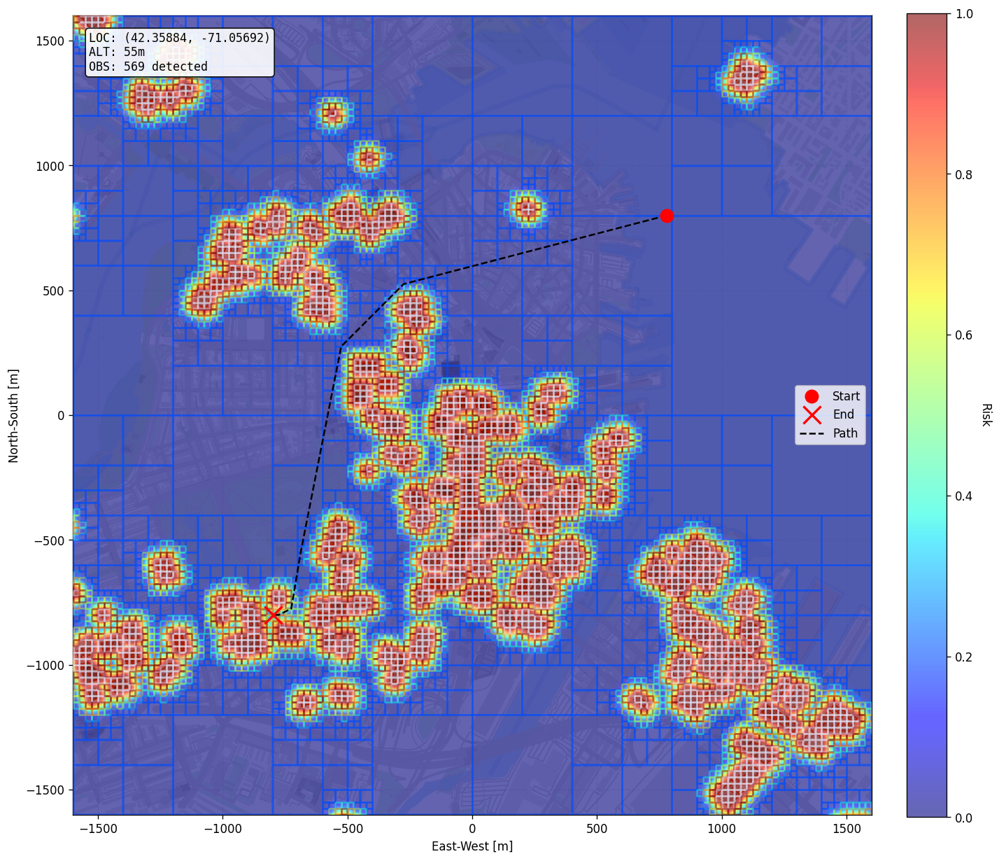

In [14]:
fig, ax = plt.subplots(figsize=(12, 12), dpi=120)

ax.set_facecolor("#f8f9fa")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.25)

ax.set_xlim(-place["dist"], place["dist"])
ax.set_ylim(-place["dist"], place["dist"])
ax.set_xlabel("East-West [m]")
ax.set_ylabel("North-South [m]")


img = ax.imshow(display, cmap='jet', extent=extent, alpha=0.6, zorder=20)

# Draw environment (streets/buildings) underneath
viz.plot_environment(ax)

# Add Colorbar (Optional, matches the purple theme)
cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Risk', rotation=270, labelpad=15)

draw_quadtree_boundaries(ax, quadtree)

ax.plot(path[0, 0], path[0, 1], 'r.', markersize=20.0, markeredgewidth=2, zorder=999, label="Start")
ax.plot(path[-1, 0], path[-1, 1], 'rx', markersize=15.0, markeredgewidth=2, zorder=999, label="End")
ax.plot(path[:, 0], path[:, 1], 'k--', alpha=1.0, zorder=998, label="Path")

obs_count = len(field)
loc, alt = place["location"], place["altitude"]+5
info_str = (f"LOC: {loc}\n"
            f"ALT: {alt}m\n"
            f"OBS: {obs_count} detected")

ax.text(0.02, 0.98, info_str, transform=ax.transAxes,
        va="top", fontsize=10, family="monospace",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.9), zorder=1000)

ax.legend(loc='right').set_zorder(1000)

plt.tight_layout()
plt.show()

## Many paths

### Simple Traveling Salesman Problem Solver for delivery points

In [ ]:
locations = np.random.random((20, 2))*quadtree.size*0.9 + np.array(field.bbox[0])

while any([quad.boundary_max_range > 0.5 for quad in quadtree.find_quad(locations)]):
    locations = np.random.random((20, 2))*quadtree.size*0.9 + np.array(field.bbox[0])

print("Locations found.")


In [16]:
def held_karp_tsp(points):
    n = len(points)
    dist = np.linalg.norm(points[:, np.newaxis] - points[np.newaxis, :], axis=2)
    C = {}

    # Initialize with direct distances from the starting city to each other city
    for k in range(1, n):
        C[(1 << k, k)] = (dist[0, k], 0)

    # Iterate through subsets of increasing size
    for subset_size in range(2, n):
        for subset in itertools.combinations(range(1, n), subset_size):
            bits = 0
            for bit in subset:
                bits |= 1 << bit
            for k in subset:
                prev_bits = bits & ~(1 << k)
                res = []
                for m in subset:
                    if m == k:
                        continue
                    res.append((C[(prev_bits, m)][0] + dist[m, k], m))
                C[(bits, k)] = min(res)

    # Final step: return to starting city
    bits = (1 << n) - 2
    res = []
    for k in range(1, n):
        res.append((C[(bits, k)][0] + dist[k, 0], k))
    _, parent = min(res)

    # Reconstruct the optimal path
    path = [0]
    bits = (1 << n) - 2
    last = parent
    for _ in range(n - 1):
        path.append(last)
        new_bits = bits & ~(1 << last)
        _, last = C[(bits, last)]
        bits = new_bits
    path.append(0)

    return points[path]


print("Determining schedule order.")

locations2 = held_karp_tsp(locations) # Delivery order
starts, ends = locations2[:-1], locations2[1:]

print("Schedule determined.")

paths = []

for sub_start, sub_end in zip(starts, ends):
    sub_path = planner.find_path(sub_start, sub_end, scaler=lambda x: 1/(1.2*(1.0 - x + 1e-10)), refresh_network=False, smooth_path=True)
    paths.append(sub_path)

Determining schedule order.
Schedule determined.


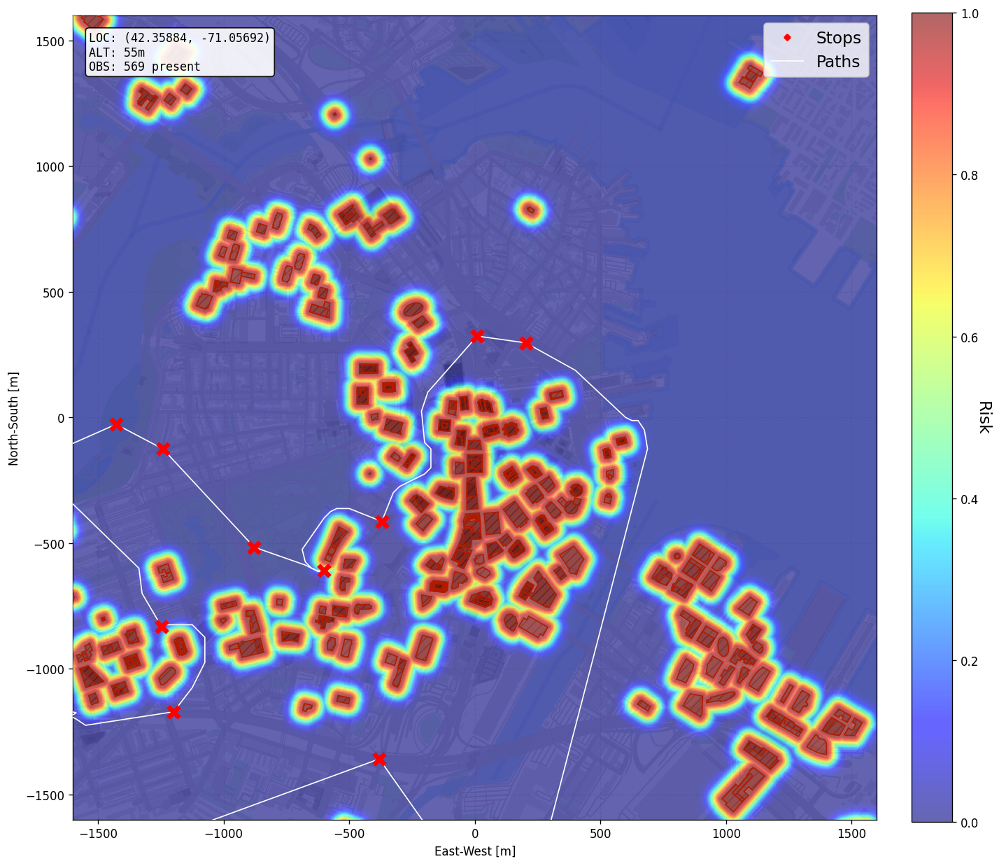

In [17]:
fig, ax = plt.subplots(figsize=(12, 12), dpi=120)
ax.set_facecolor("#f8f9fa")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.25)

ax.set_xlim(-place["dist"], place["dist"])
ax.set_ylim(-place["dist"], place["dist"])
ax.set_xlabel("East-West [m]")
ax.set_ylabel("North-South [m]")

img = ax.imshow(display, cmap='jet', extent=extent, alpha=0.6, zorder=20)
viz.plot_environment(ax)

path_labeled = False
stop_labeled = False

for sub_path, sub_start, sub_end in zip(paths, starts, ends):
    if sub_path is None:
        ax.plot(sub_start[0], sub_start[1], 'rx', markersize=10.0, markeredgewidth=1.5)
        ax.plot(sub_end[0], sub_end[1], 'r4', markersize=10.0, markeredgewidth=1.5)
    else:
        stop_label = "Stops" if not stop_labeled else ""
        path_label = "Paths" if not path_labeled else ""
        
        ax.plot(sub_path[0, 0], sub_path[0, 1], 'rx', markersize=10.0, 
                markeredgewidth=4, zorder=999, label=stop_label)
        ax.plot(sub_path[:, 0], sub_path[:, 1], 'w-', alpha=1.0, linewidth=1, 
                zorder=998, label=path_label)
        
        stop_labeled = True
        path_labeled = True

cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04)
cbar.set_ticks([0.0] + edges + [1.0])
cbar.set_label('Risk', fontsize=14, rotation=270, labelpad=10)

obs_count = len(viz.get_obstacle_rgjs())
loc, alt = place["location"], place["altitude"]+5
info_str = f"LOC: {loc}\nALT: {alt}m\nOBS: {obs_count} present"

ax.text(0.02, 0.98, info_str, transform=ax.transAxes, va="top", 
        fontsize=10, family="monospace", zorder=1000,
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.9))

ax.legend(loc='upper right', fontsize=14, markerscale=0.4).set_zorder(1000)
plt.tight_layout()
plt.show()

## Live routing

In [18]:
%matplotlib inline
%matplotlib tk

fig, ax = plt.subplots(figsize=(12, 12), dpi=120)

ax.set_facecolor("#f8f9fa")
ax.set_aspect("equal")
ax.grid(True, linestyle="--", alpha=0.25)

ax.set_xlim(-place["dist"], place["dist"])
ax.set_ylim(-place["dist"], place["dist"])
ax.set_xlabel("West-East [m]")
ax.set_ylabel("North-South [m]")
img = ax.imshow(display, cmap='jet', extent=extent, alpha=0.6, zorder=20)

viz.plot_environment(ax)

obs_count = len(viz.get_obstacle_rgjs())
loc, alt = place["location"], place["altitude"]
info_str = (f"LOC: {loc}\n"
            f"ALT: {alt} - {alt+20}m\n"
            f"OBS: {obs_count} present")

ax.text(0.02, 0.98, info_str, transform=ax.transAxes,
        va="top", fontsize=10, family="monospace",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.9), zorder=1000)

prev = None
planning_active = False

def on_key(event):
    global planning_active
    if event.key == 'm':
        planning_active = not planning_active
        print(f"Path planning state: {'ON' if planning_active else 'OFF'}")

def on_click(event):
    global prev, planning_active
    
    if not planning_active:
        return
        
    if event.inaxes == ax:
        x, y = event.xdata, event.ydata
        
        ax.plot(x, y, 'rx', markersize=8, markeredgewidth=2, zorder=2000)
        print(f"({x:.4f}, {y:.4f})")

        if prev is not None:
            route = planner.find_path(prev, (x, y), refresh_network=False)
            if route is not None:
                ax.plot(route[:, 0], route[:, 1], '-', color="#000", alpha=1.0, linewidth=1.0, zorder=31)
        
        prev = (x, y)
        fig.canvas.draw()

cid_click = fig.canvas.mpl_connect('button_press_event', on_click)
cid_key = fig.canvas.mpl_connect('key_press_event', on_key)

plt.tight_layout()
plt.show()

Path planning state: ON
(-1146.5478, -304.8699)
(50.6309, 639.9121)
(-321.1425, -645.9465)
(695.2656, -755.0910)
(-641.7545, -1024.5415)
(-1327.3184, -707.3403)
(-733.8452, -799.4309)
(-692.9160, -632.3034)
(-617.8791, -673.2326)
(-1347.7830, -625.4819)
(-890.7404, -789.1987)
(-989.6526, -819.8955)
(-1180.6555, -649.3573)
(-1149.9586, -860.8247)
(-989.6526, -905.1647)
(-1115.8509, -908.5754)
(-590.5930, -1201.9013)
(-617.8791, -1062.0599)
(964.7161, -765.3233)
(1138.6651, 1489.1928)
(-1091.9755, 602.3937)
(-1282.9784, -1164.3829)
